In [2]:
!pip install tensorflow

  Using cached keras-2.15.0-py3-none-any.whl.metadata (2.4 kB)
Using cached keras-2.15.0-py3-none-any.whl (1.7 MB)
  Attempting uninstall: keras
    Found existing installation: keras 3.1.1
    Can't uninstall 'keras'. No files were found to uninstall.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


In [3]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
from random import randint

2024-04-13 04:34:16.092676: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-13 04:34:16.092808: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-13 04:34:16.234163: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
LENGTH_SEQUENCE = 6

In [5]:
def make_dataset(length_sequence, init, end):
    fluids_file = '/kaggle/input/fluids'
    all_frames_sequence = []
    for simulation_number in range(init, end):
        file_name = fluids_file + str(simulation_number) + '/'
        fluids_paths = os.listdir(file_name)
        for fluid_path in fluids_paths:
            frames_names = os.listdir(file_name + '/' + fluid_path + '/')
            j = 0
            frames_sequence = []
            for frame_name in frames_names:
                j += 1
                number_exist = False
                while not number_exist:
                    try:
                        image = plt.imread(file_name + fluid_path + '/' + 'frame' + str(j) + '.jpg')
                        number_exist = True
                        frames_sequence.append(file_name + fluid_path + '/' + 'frame' + str(j) + '.jpg')
                    except FileNotFoundError:
                        j += 1
            all_frames_sequence.append(frames_sequence)

    dataset = []
    for sequence in all_frames_sequence:
        for i in range(len(sequence) - length_sequence):
            dataset.append(sequence[i:i+length_sequence])
    
    return dataset

In [6]:
ds_test = make_dataset(LENGTH_SEQUENCE, 1, 5)
ds_val  = make_dataset(LENGTH_SEQUENCE, 5, 8)
ds_train  = make_dataset(LENGTH_SEQUENCE, 8, 20)

In [7]:
print(len(ds_train))
print(len(ds_val))
print(len(ds_test))

10091
2697
3507


In [8]:
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, batch_size, shuffle=True):
        self.list_IDs = list_IDs # array of strings with original images name with directory
        self.batch_size = batch_size #3d-images per batch
        self.shuffle = shuffle # true or false to shuffle data after any epochs
        self.on_epoch_end() # call of the function


    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))


    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)
        
        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples'
        X = []
        y = []

        # Generate data
        for ID in list_IDs_temp:
            # Store sample
            features = []
            for i in range(len(ID)-1):
                features.append(cv2.resize(plt.imread(ID[i]), (240, 228))/255.0)
            features.reverse()
            X.append(features)
            y.append(cv2.resize(plt.imread(ID[0]), (240, 228))/255.0)
                
        return np.array(X), np.array(y)

In [9]:
class InceptionBlock(tf.keras.layers.Layer):
    def __init__(self, filters, **kwargs):
        super().__init__(**kwargs)
        
        self.conv_a    = tf.keras.layers.Conv2D(filters, kernel_size=(1,1), padding='same')
        self.bn_a      = tf.keras.layers.BatchNormalization()
        self.act_a     = tf.keras.activations.get('swish')
        
        self.conv_b1   = tf.keras.layers.Conv2D(filters, kernel_size=(1, 1), padding='same')
        self.conv_b2   = tf.keras.layers.Conv2D(filters, kernel_size=(3, 3), padding='same')
        self.bn_b      = tf.keras.layers.BatchNormalization()
        self.act_b     = tf.keras.activations.get('swish')
        
        self.conv_c1   = tf.keras.layers.Conv2D(filters, kernel_size=(1, 5), padding='same')
        self.conv_c2   = tf.keras.layers.Conv2D(filters, kernel_size=(5, 1), padding='same')
        self.bn_c      = tf.keras.layers.BatchNormalization()
        self.act_c     = tf.keras.activations.get('swish')
        
    def call(self, x):
        out1 = self.conv_a(x)
        out1 = self.bn_a(out1)
        out1 = self.act_a(out1)
        
        out2 = self.conv_b1(x)
        out2 = self.conv_b2(out2)
        out2 = self.bn_b(out2)
        out2 = self.act_b(out2)
        
        out3 = self.conv_c1(x)
        out3 = self.conv_c2(out3)
        out3 = self.bn_c(out3)
        out3 = self.act_c(out3)
        
        return tf.concat([out1, out2, out3], axis=3)

class Network(tf.keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.block_1 = [InceptionBlock(16),
                        InceptionBlock(32),
                        InceptionBlock(48)]
        
        self.block_2 = [InceptionBlock(16),
                        InceptionBlock(32),
                        InceptionBlock(48),
                        InceptionBlock(64)]
        
        self.block_3 = [InceptionBlock(16),
                        InceptionBlock(32),
                        InceptionBlock(48),
                        InceptionBlock(64),
                        InceptionBlock(80)]
        
        self.block_4 = [InceptionBlock(16),
                        InceptionBlock(32),
                        InceptionBlock(48),
                        InceptionBlock(64),
                        InceptionBlock(80),
                        InceptionBlock(96)]
        
        self.block_5 = [InceptionBlock(16),
                        InceptionBlock(32),
                        InceptionBlock(48),
                        InceptionBlock(64),
                        InceptionBlock(80),
                        InceptionBlock(96),
                        InceptionBlock(112),
                        tf.keras.layers.Conv2D(filters=3, kernel_size=1, activation='sigmoid')]
        
    def call(self, x):
        img1, img2, img3, img4, img5 = x[:,0], x[:,1], x[:,2], x[:,3], x[:,4]

        for layer in self.block_1:
            img1 = layer(img1)
        
        img2 = tf.concat([img1, img2], axis=-1)
        for layer in self.block_2:
            img2 = layer(img2)
        
        img3 = tf.concat([img1, img2, img3], axis=-1)
        for layer in self.block_3:
            img3 = layer(img3)
        
        img4 = tf.concat([img1, img2, img3, img4], axis=-1)
        for layer in self.block_4:
            img4 = layer(img4)
        
        img5 = tf.concat([img1, img2, img3, img4, img5], axis=-1)
        for layer in self.block_5:
            img5 = layer(img5)
        
        return img5

In [10]:
model = Network()
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='mae')

In [11]:
gen_train = DataGenerator(ds_train, 2)
gen_test = DataGenerator(ds_test, 2)
gen_val = DataGenerator(ds_val, 2)

In [12]:
checkpoint_train_loss = tf.keras.callbacks.ModelCheckpoint(filepath='/kaggle/working/min_train_loss/',
                                                             save_weights_only=True,
                                                             monitor='loss',
                                                             mode='min',
                                                             save_best_only=True)

checkpoint_val_loss = tf.keras.callbacks.ModelCheckpoint(filepath='/kaggle/working/min_val_loss/',
                                                             save_weights_only=True,
                                                             monitor='val_loss',
                                                             mode='min',
                                                             save_best_only=True)
def lr_scheduler(epoch, lr):
    return lr*0.99

In [13]:
model.load_weights('/kaggle/working/min_val_loss/')

In [14]:
#train_history = model.fit(gen_train, epochs=14, validation_data=gen_val, callbacks=[checkpoint_train_loss, checkpoint_val_loss])

In [15]:
model.evaluate(gen_test)

1753/1753 [==============================] - 257s 144ms/step - loss: 6.7183e-04


0.00067183404462412

In [16]:
def load_data_for_unit_test(number_of_sequences, sequences_data, seed=None):
    if seed is not None:
        np.random.seed(seed)
    np.random.shuffle(ds_train)
    
    sequences = []
    results = []
    for i in range(number_of_sequences):
        sequence = []
        for j in range(LENGTH_SEQUENCE-1):
            sequence.append((cv2.resize(plt.imread(sequences_data[i][j]), (240, 228))/255.0))
        sequences.append(sequence)    
        results.append((cv2.resize(plt.imread(sequences_data[i][-1]), (240, 228))/255.0))
    
    return np.array(sequences), np.array(results)

In [17]:
def unit_test(sequences, results):
    plt.figure(figsize=(25, 35))
    
    predicted_data = model.predict(sequences, batch_size=1, verbose=0)
    k = 0
    for i in range(len(sequences)):
        for j in range(LENGTH_SEQUENCE-1):
            k += 1
            plt.subplot(len(sequences), LENGTH_SEQUENCE+1,k)
            plt.title(f'frame {i+1}.{j+1}')
            plt.imshow(sequences[i][j])
        
        error = round(np.mean(tf.keras.losses.MAE(results[i], predicted_data[i])),9)
        plt.subplot(len(sequences), LENGTH_SEQUENCE+1, k+1)
        plt.title(f'expected output {i+1}')
        plt.imshow(results[i])
        plt.subplot(len(sequences), LENGTH_SEQUENCE+1, k+2)
        plt.title(f'output {i+1} [error: {error}]')
        plt.imshow(predicted_data[i])
        k += 2        

In [18]:
np.random.shuffle(ds_test)

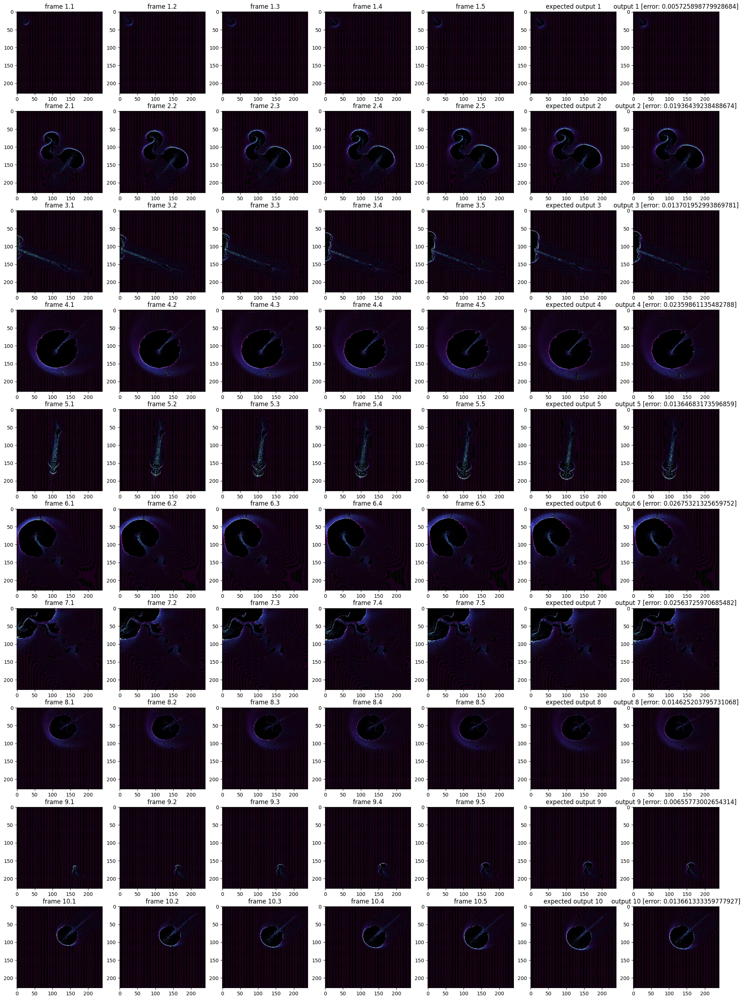

In [19]:
s, r = load_data_for_unit_test(10, ds_test)
unit_test(s, r)

In [24]:
def load_data_for_progressive_test(number_of_sequences, number_of_outputs, seed=None):    
    sequences_data = make_dataset(number_of_sequences+number_of_outputs, 1, 5)
    
    if seed is not None:
        np.random.seed(seed)
    np.random.shuffle(sequences_data)
    
    sequences = []
    results = []
    for i in range(number_of_sequences):
        sequence = []
        for j in range(LENGTH_SEQUENCE + number_of_outputs - 1):
            sequence.append((cv2.resize(plt.imread(sequences_data[i][j]), (240, 228))/255.0))
        sequences.append(sequence)    
    
    return np.array(sequences)

In [25]:
def progressive_test(sequences):
    plt.figure(figsize=(40, 40))
    
    number_of_outputs = len(sequences[0]) - LENGTH_SEQUENCE + 1
    
    k = 0
    for i in range(len(sequences)):
        for j in range(len(sequences[0])):
            k += 1
            plt.subplot(len(sequences)*2, len(sequences[0]), k)
            plt.title(f'frame {i+1}.{j+1}')
            plt.imshow(sequences[i][j])
            
        for j in range(len(sequences[0])-number_of_outputs):
            k += 1
            plt.subplot(len(sequences)*2, len(sequences[0]), k)
            plt.title(f'frame {i+1}.{j+1}')
            plt.imshow(sequences[i][j])
        
        for j in range(number_of_outputs):
            k += 1
            predicted_data = model.predict(np.array([sequences[i][j:j+LENGTH_SEQUENCE-1]]), batch_size=1, verbose=0)
            error = round(np.mean(tf.keras.losses.MAE(predicted_data, sequences[i][j+LENGTH_SEQUENCE-1])), 9)
            plt.subplot(len(sequences)*2, len(sequences[0]), k)
            plt.title(f'output {i+1}.{j+1} [error: {error}]')
            plt.imshow(predicted_data[0])     

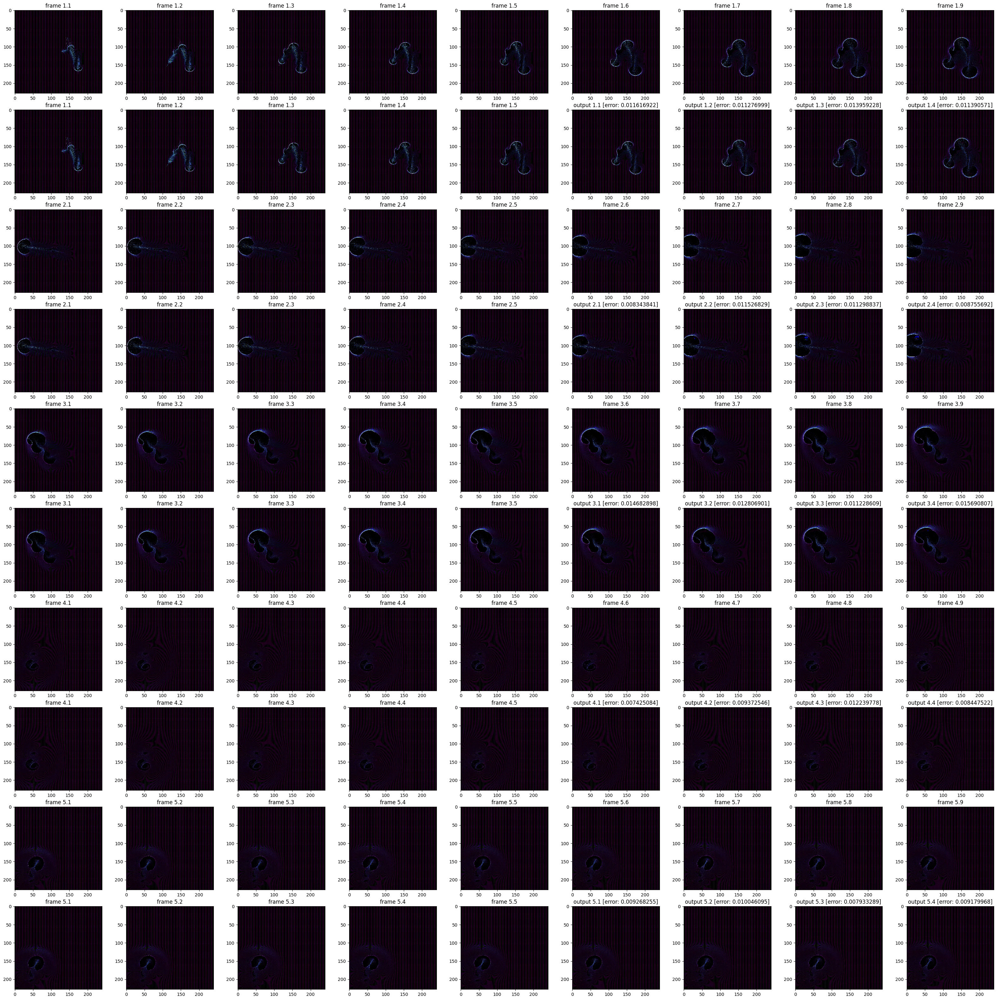

In [27]:
s = load_data_for_progressive_test(5, 4, randint(0, 1000))
progressive_test(s)